In [535]:
import pandas as pd
import numpy as np

In [536]:
df = pd.read_csv('./full_descriptor_dataset.csv')

In [537]:
df

,name,melodic,rhythmic,energetic,apathetic,raw,surreal,anxious,bittersweet,warm,...,acoustic,sentimental,angry,spiritual,sad,happy,epic,minimalistic,futuristic,natural
0,Living in Darkness,1,1,1,0,1,0,1,0,0,...,0,0,1,0,2,0,0,0,0,0
1,Souvenirs d'un autre monde,1,0,0,0,0,1,0,1,1,...,0,2,0,1,1,0,0,0,0,2
2,People Who Can Eat People Are the Luckiest Peo...,1,0,2,0,1,0,1,1,0,...,1,1,0,0,3,1,0,0,0,0
3,Funeral,1,0,0,0,0,1,1,2,0,...,0,2,0,0,1,2,1,0,0,1
4,Neon Bible,1,0,0,0,0,1,1,0,0,...,0,1,0,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444,In the Aeroplane Over the Sea,1,0,0,0,2,2,0,2,1,...,1,2,0,0,2,0,0,0,0,1
445,McCartney,1,0,0,0,2,0,0,1,1,...,0,0,0,0,1,1,0,1,0,0
446,Hail to the Thief,1,1,1,0,0,1,1,0,0,...,0,1,1,0,3,0,0,0,0,1
447,Wish You Were Here,1,0,0,0,0,1,0,2,0,...,0,1,0,0,2,0,1,0,0,0


In [538]:
df.drop('name', axis=1, inplace=True)

### Grouping similar descriptors together

As of now, our dataset has 38 features. One thing that may be notice just by looking at some samples in the dataset is that, in this 38-dimension vector space, most samples have more 0-values than non-0-values, which means that they are very very close to the vector space origin, and therefore all very close to each other. This is a problem for k-Means Clustering, since it's an algorithm primarily based on distance between data points and centroids, so once our data points are so close together, it's likely that they'll all just form one big cluster. This means we should reduce even further our number of dimensions by using the same strategy we used in "02_Data_Modelling.ipynb": grouping similar descriptors together.

However, since we have less material to work with, we can afford to be assisted by the "Correlation Matrix", which tells us how much linearly correlated 2 different features are. So what we'll be doing is use the correlation numbers to assist our decisions of which descriptors to group together. A high correlation number indicates that it makes sense to group those 2 features, but still it should be taken more as a hint than a rule.

In general, what we are aiming for is reducing the number of features even more, leaving us with grouped features that hold more variance (good for clustering!).

### What about scales?

As a motivating example, let's suppose we group some features (B1, B2, B3, B4, B5, B6, B7, B8, B9) into a "super-feature" (B).

Let's say these features (B1, B2...) represent the presence of the associated descriptor as the positive number 1. What happens if, by chance, an album shows the descriptors 'B1' and 'B2'? Should we represent it as a 1 since they are all in the "B" super-feature? Or maybe as a 2, since it presents not only one but two sub-features inside B?

For this problem, we'll take the second approach. This is so the data can express a sense of "how strongly is this album associated with said super-feature", since many appearences of the sub-features imply a much more strong and ingrained relation of such album with this super-feature. In other words, an important sense of "spectrum" (existence of stronger associations, weaker associations) is captured into the data.

We can write a function for this:

In [539]:
def mergeColumns(df, col1, col2):
    
    if isinstance(col1, list):
        for col_name in col1:
            mergedColumnName = col_name + '/' + col2
        
            df[mergedColumnName] = df[col_name] + df[col2]
            df.drop(col_name, axis=1, inplace=True)
    
        df.drop(col2, axis=1, inplace=True)
        
    else:
        mergedColumnName = col1 + '/' + col2
        
        df[mergedColumnName] = df[col1] + df[col2]
        df.drop(col1, axis=1, inplace=True)
        df.drop(col2, axis=1, inplace=True)

Note: if deemed appropriate, the function is also capable of adding one column value to 2 or more other columns, in cases where 'col2' is highly correlated with more than one column that we perceive won't be grouped together latter.

Let's check the variance of each individual feature so we can compare later:

In [540]:
variances_df = df.var()
variances_sorted = variances_df.sort_values(ascending=False)
variances_sorted

noisy           2.489063
sad             2.178522
calm            1.320285
progressive     1.098145
dark            1.092855
humorous        0.930341
surreal         0.801911
happy           0.754057
bittersweet     0.560770
cold            0.538220
energetic       0.526855
warm            0.464783
raw             0.428770
spiritual       0.427329
sentimental     0.419195
mysterious      0.353892
angry           0.347667
natural         0.337486
minimalistic    0.289194
urban           0.280365
rhythmic        0.248260
anxious         0.244641
poetic          0.229876
melodic         0.227907
quirky          0.223701
atmospheric     0.222220
eclectic        0.219138
romantic        0.215002
rebellious      0.207097
dense           0.173501
apathetic       0.166839
anthemic        0.143861
futuristic      0.143822
heavy           0.112741
epic            0.097439
serious         0.079492
pastoral        0.075783
acoustic        0.070146
dtype: float64

In [541]:
# Calculating correlation matrix
corr_matrix = df.corr()

# Replacing all main diagonal values by NaN, so they don't mess up the color scheme on the heatmap we'll be plotting,
# since they are all 1.0 and not of any use
np.fill_diagonal(corr_matrix.values, np.nan)

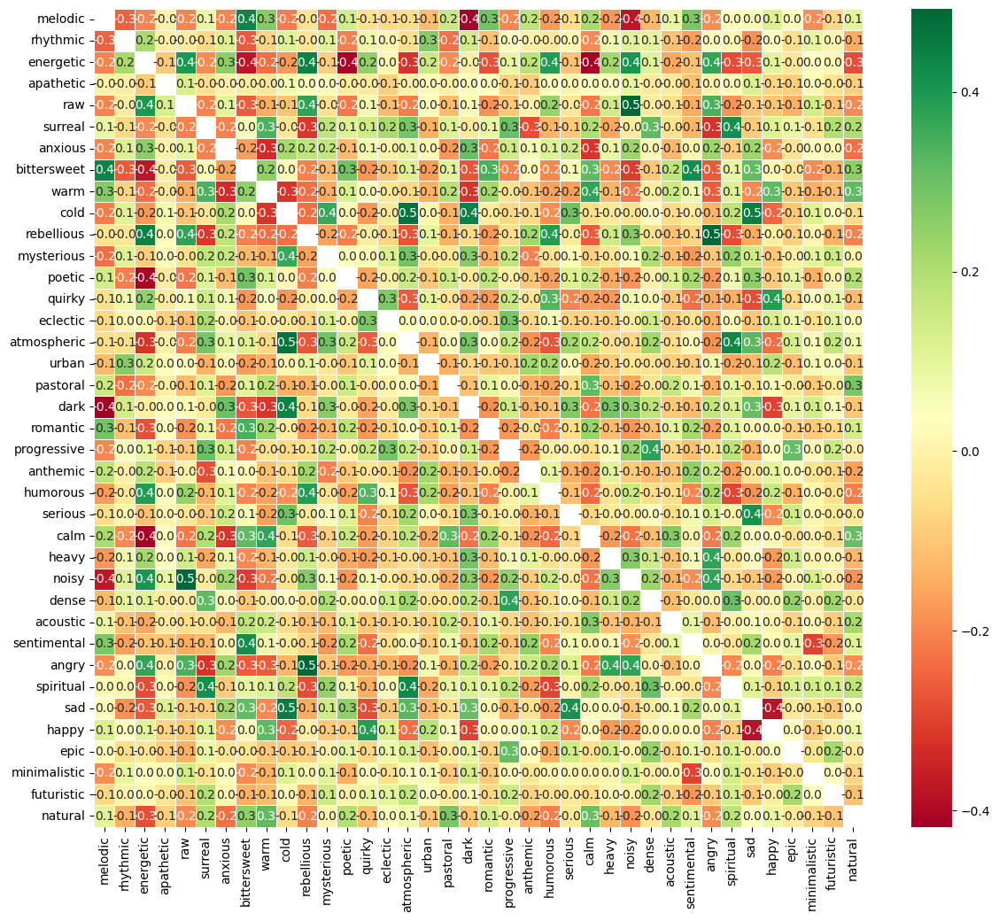

In [542]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

### In each cell below, we'll be merging 2 columns/features and plotting the correlation matrix again, to analyse what our next merge can be.

In [543]:
df2 = df.copy()

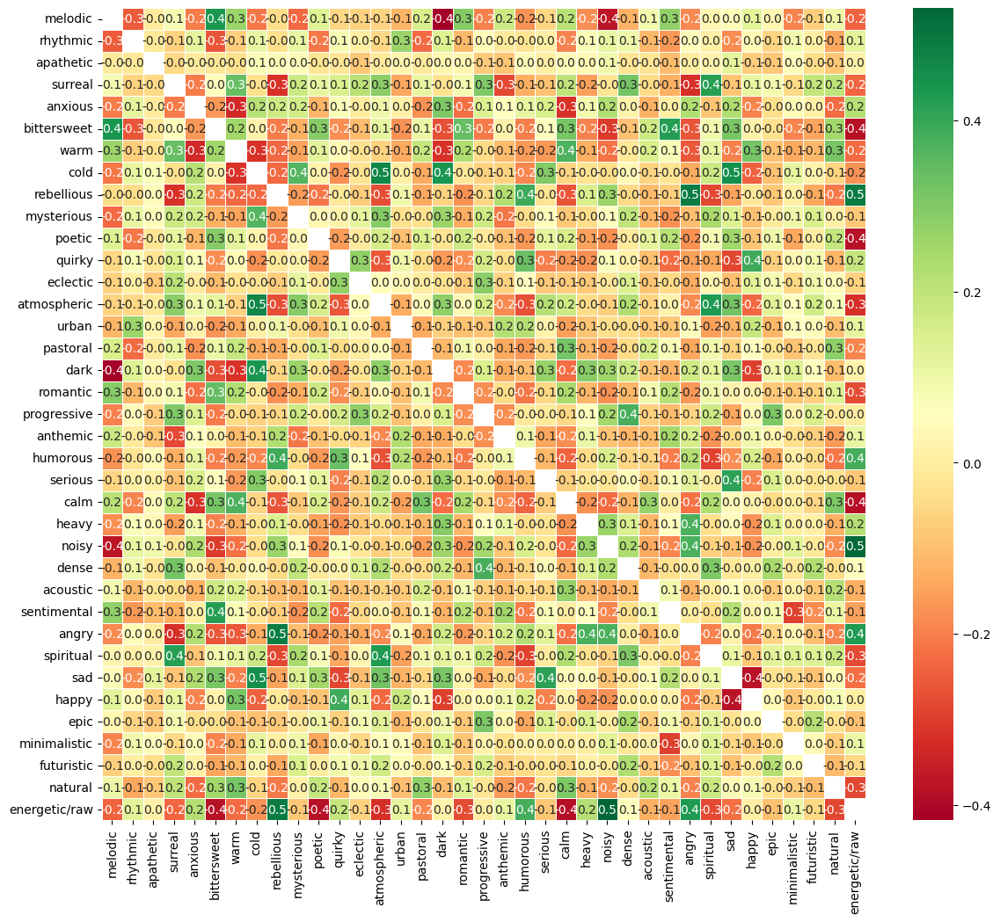

In [544]:
mergeColumns(df2, 'energetic', 'raw')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

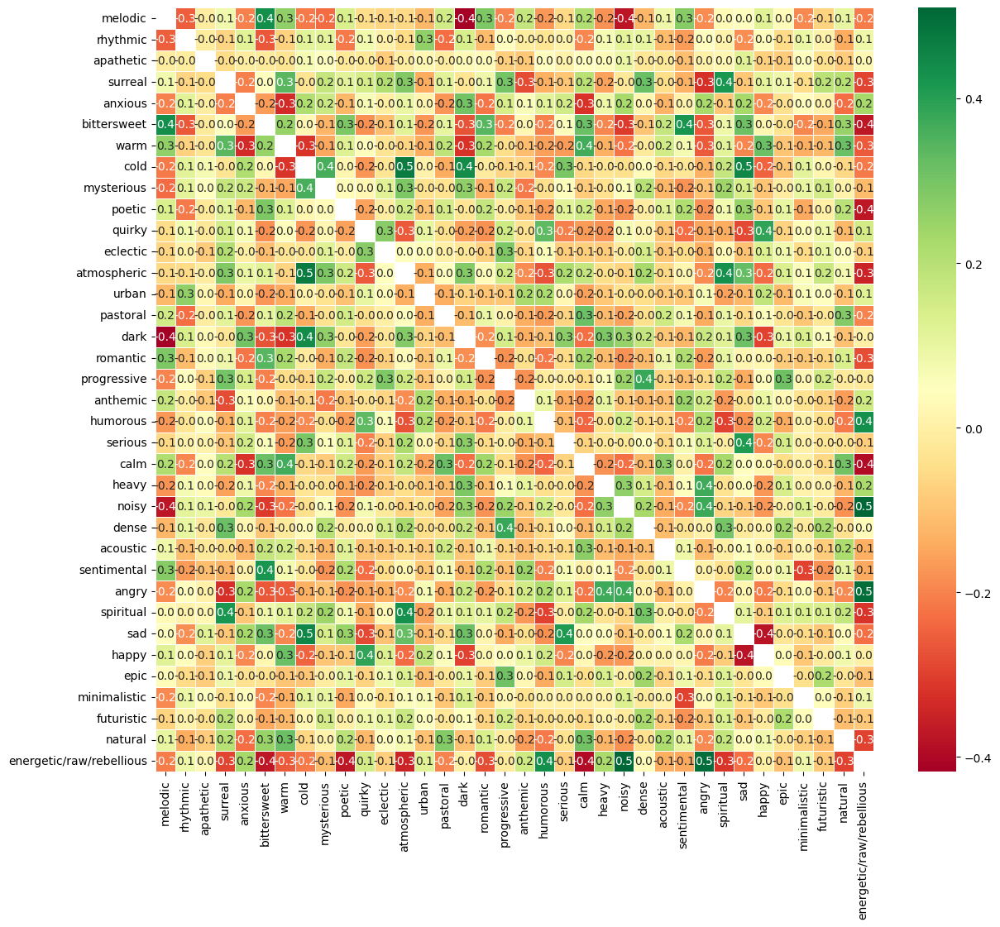

In [545]:
mergeColumns(df2, 'energetic/raw', 'rebellious')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

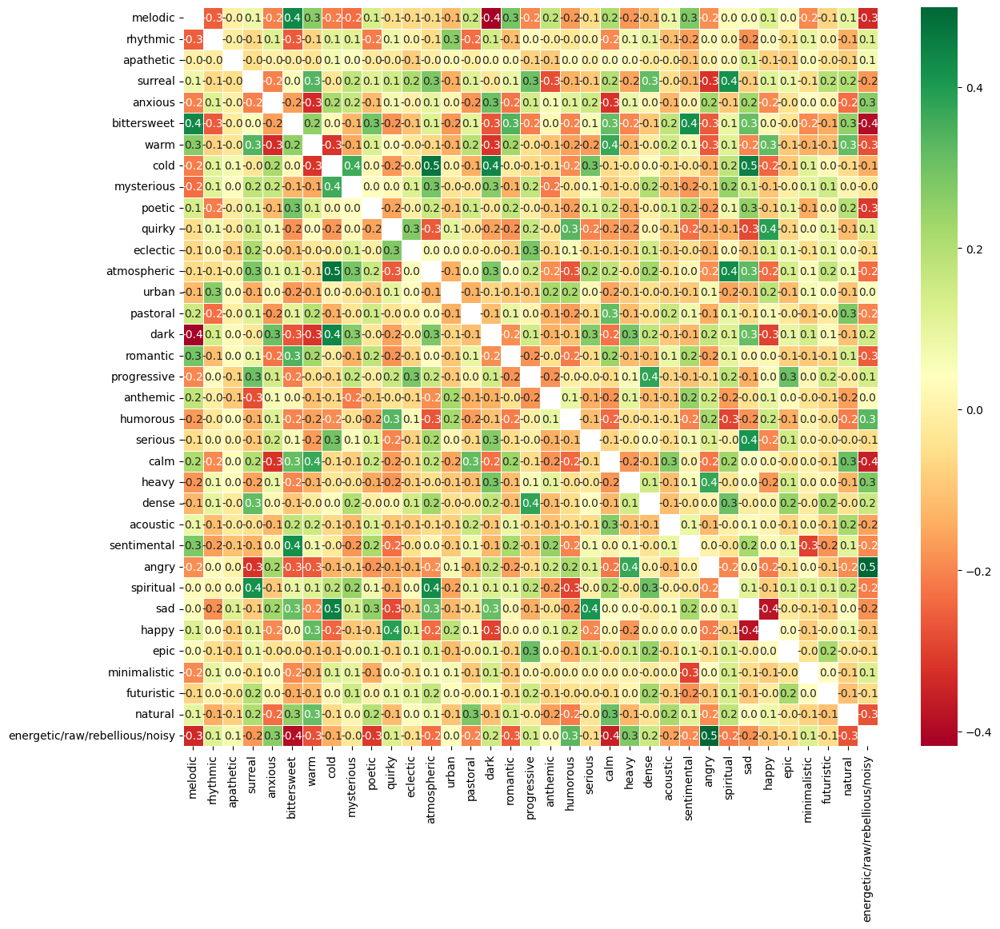

In [546]:
mergeColumns(df2, 'energetic/raw/rebellious', 'noisy')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

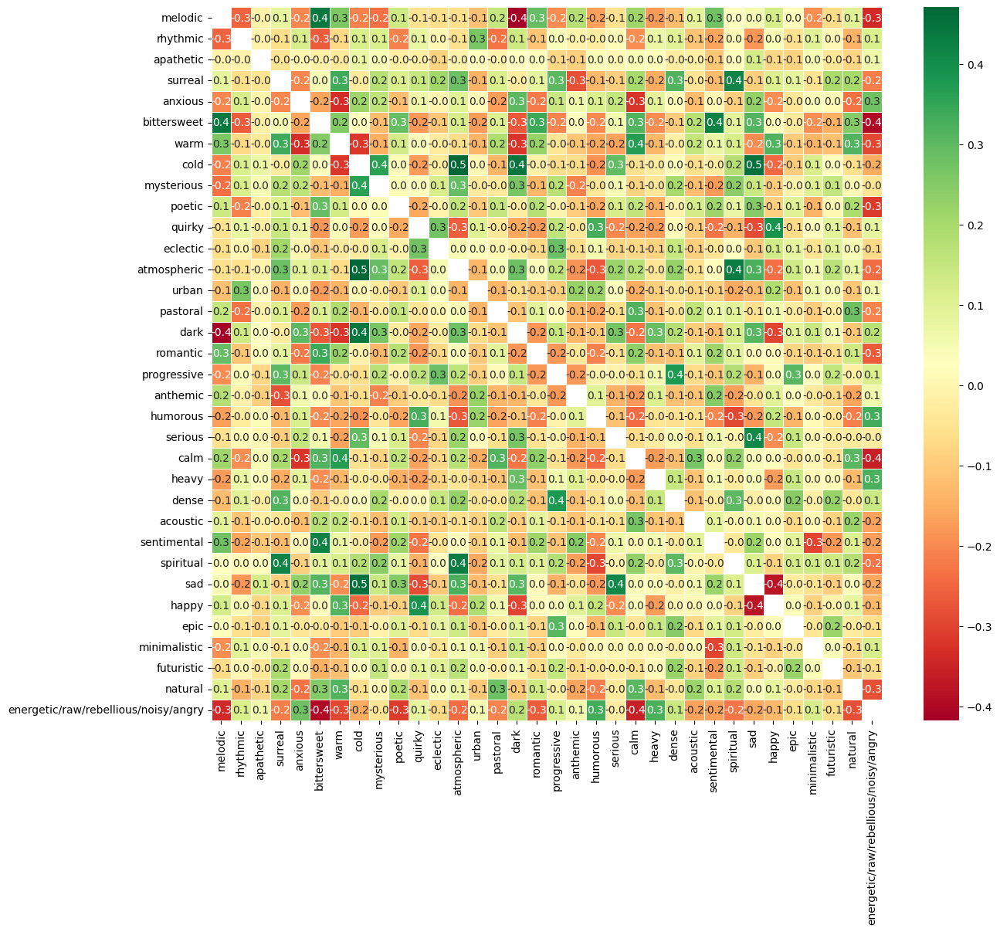

In [547]:
mergeColumns(df2, 'energetic/raw/rebellious/noisy', 'angry')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

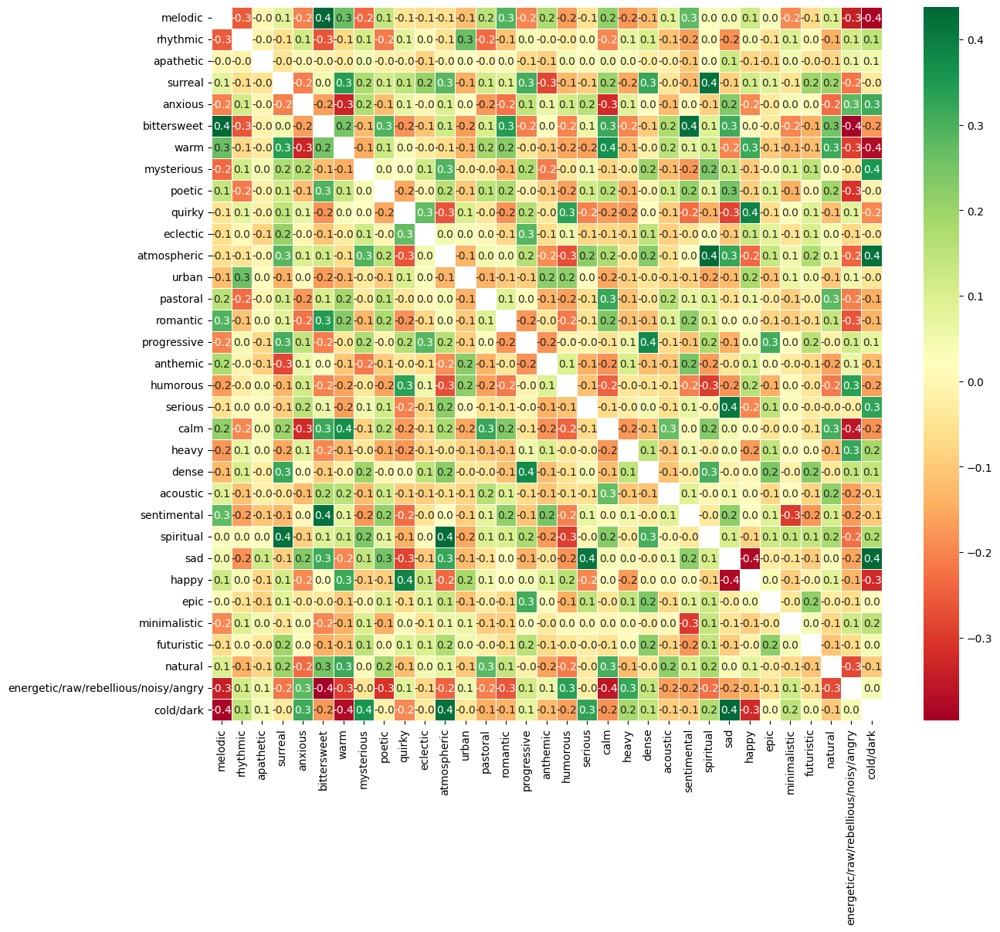

In [548]:
mergeColumns(df2, 'cold', 'dark')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

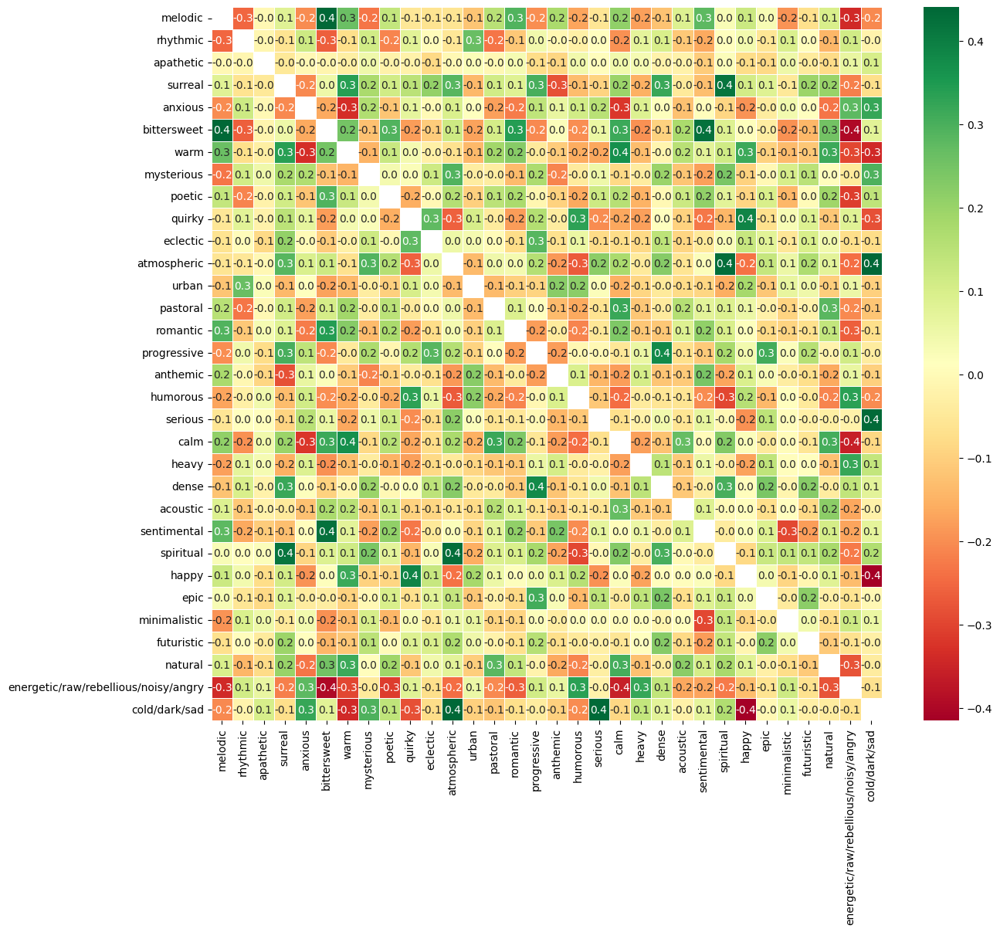

In [549]:
mergeColumns(df2, 'cold/dark', 'sad')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

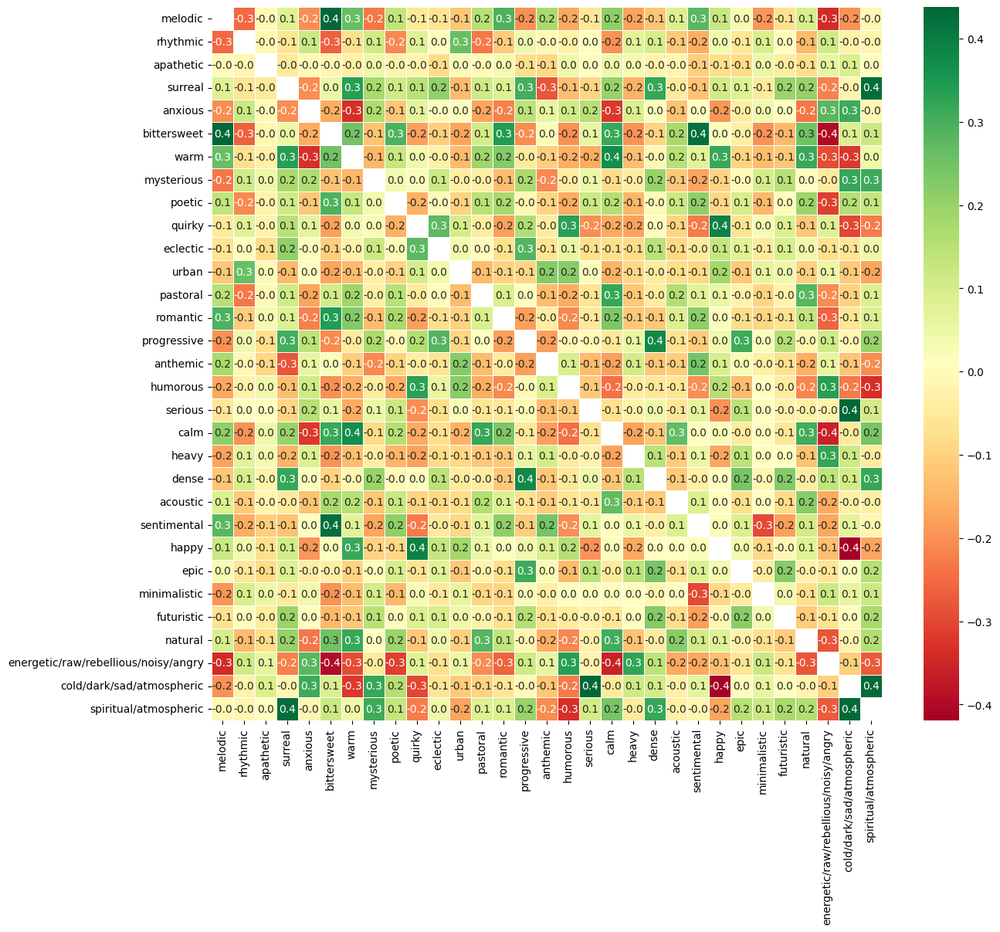

In [550]:
mergeColumns(df2, ['cold/dark/sad', 'spiritual'], 'atmospheric')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

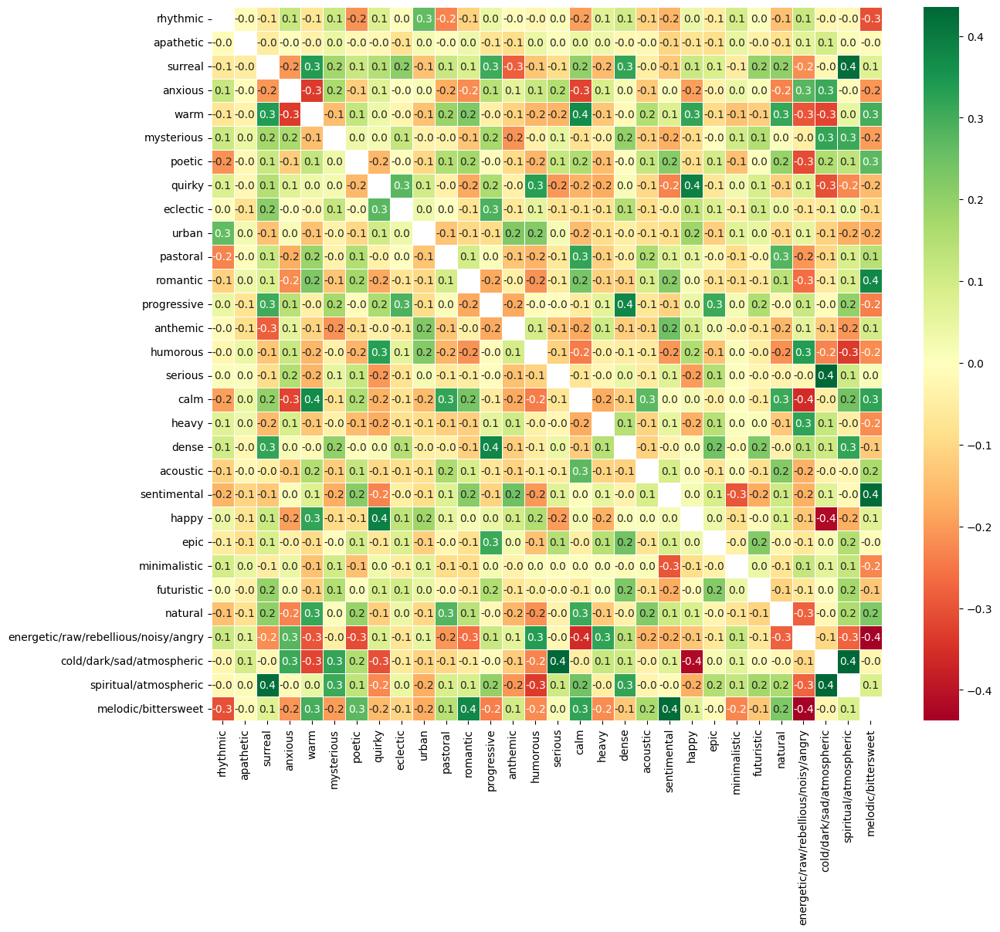

In [551]:
mergeColumns(df2, 'melodic', 'bittersweet')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

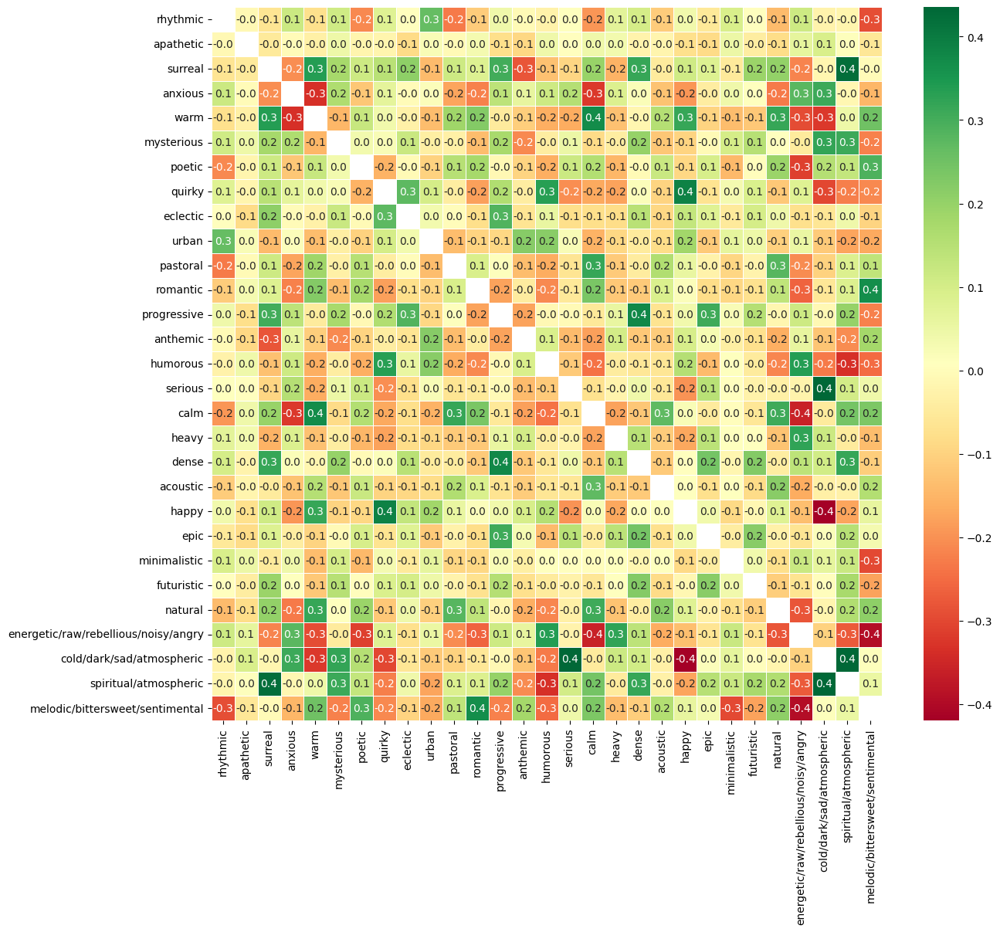

In [552]:
mergeColumns(df2, 'melodic/bittersweet', 'sentimental')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

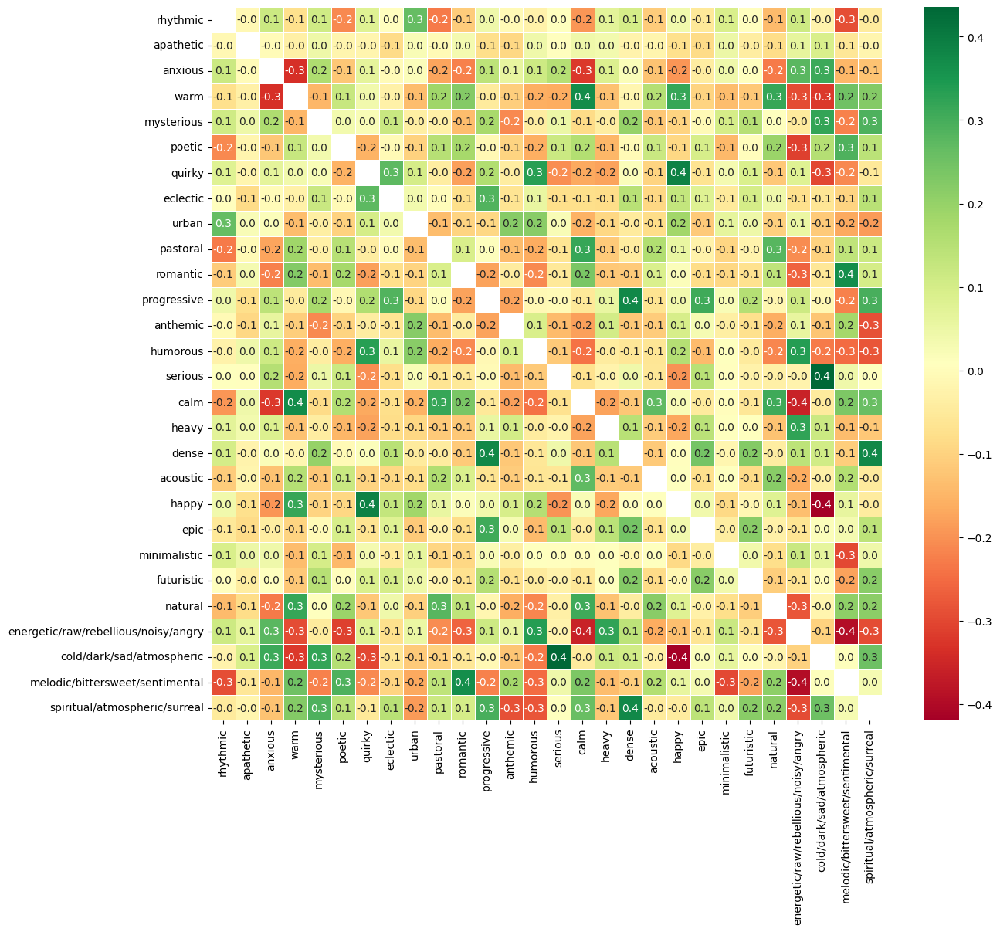

In [553]:
mergeColumns(df2, 'spiritual/atmospheric', 'surreal')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

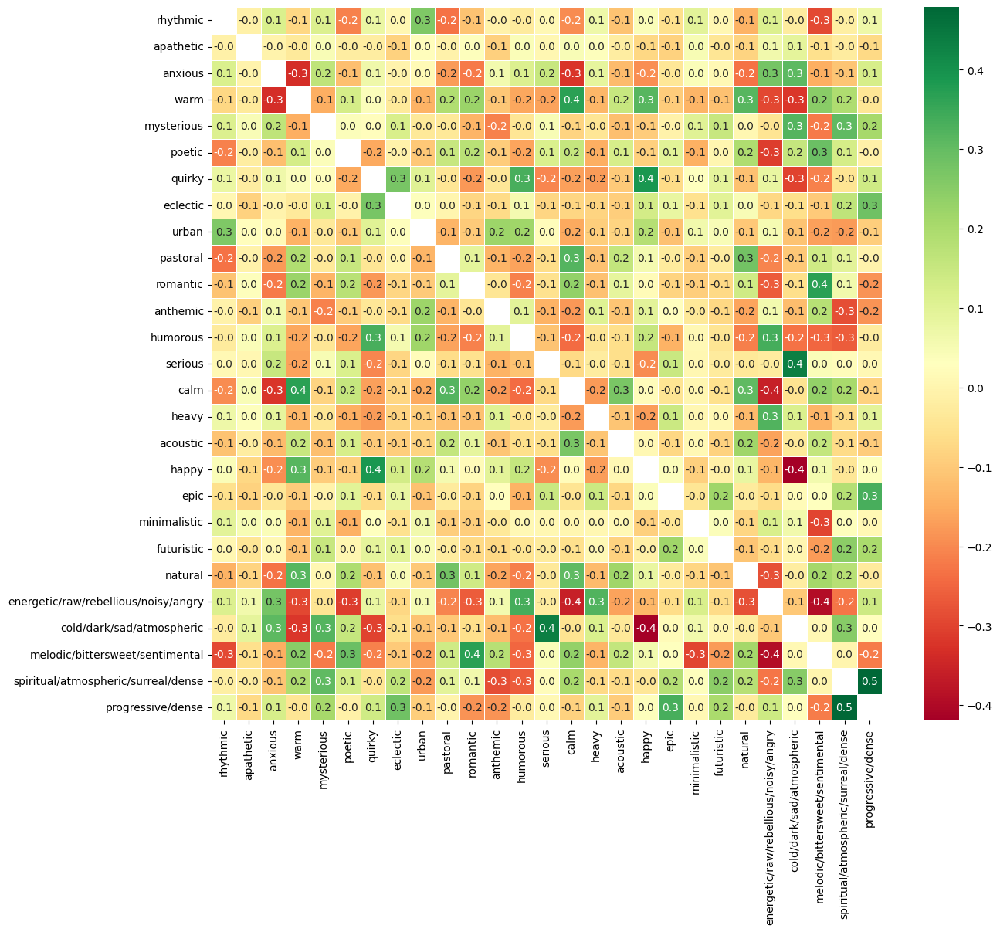

In [554]:
mergeColumns(df2, ['spiritual/atmospheric/surreal', 'progressive'], 'dense')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

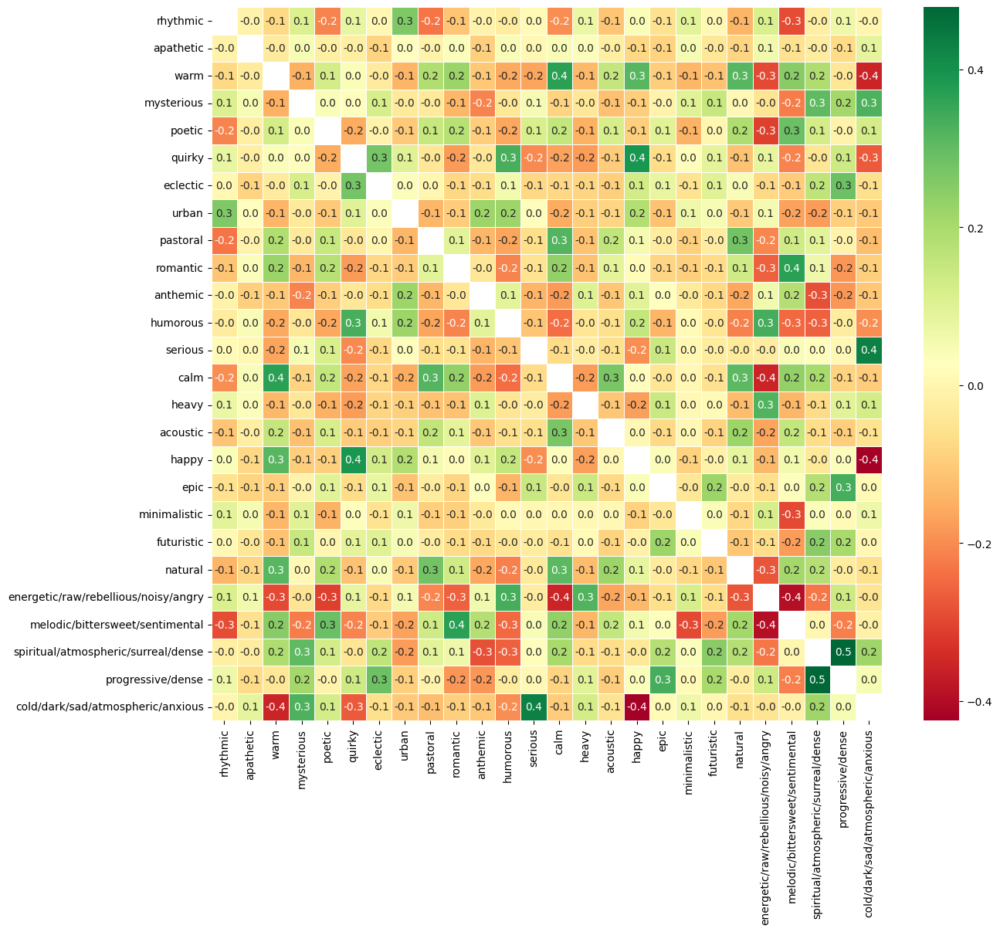

In [555]:
mergeColumns(df2, 'cold/dark/sad/atmospheric', 'anxious')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

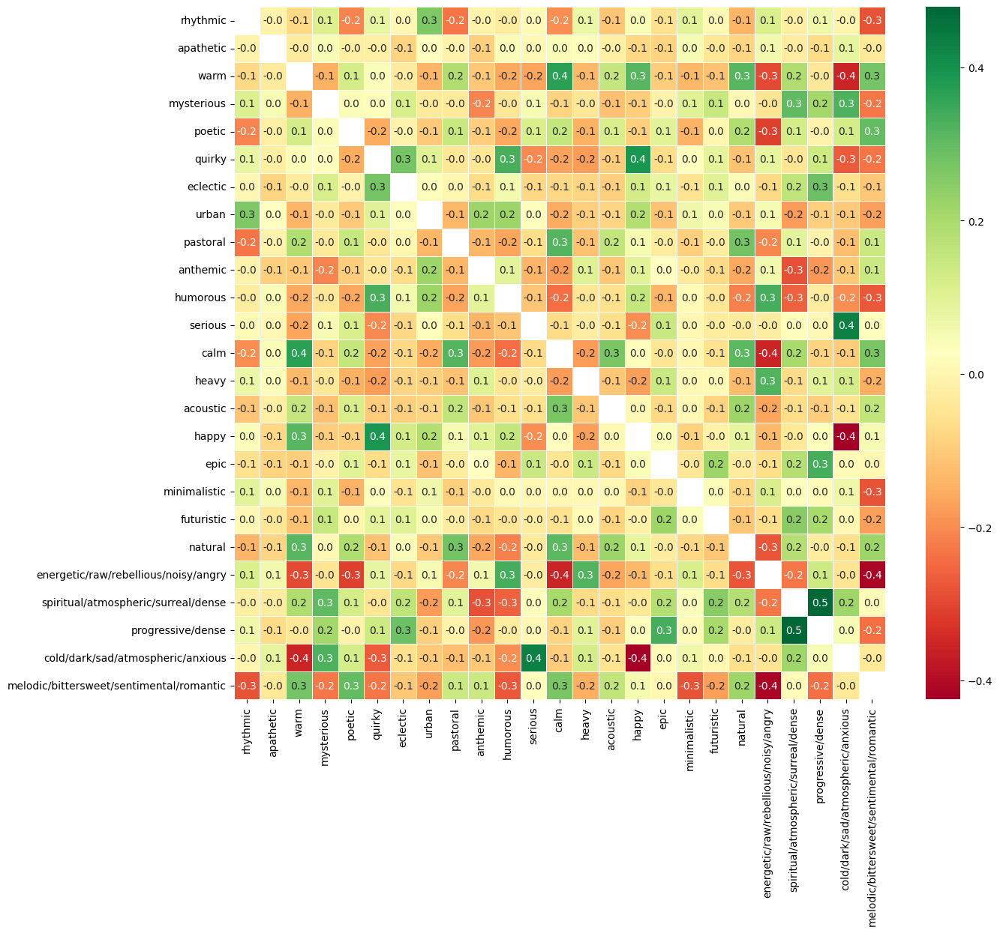

In [556]:
mergeColumns(df2, 'melodic/bittersweet/sentimental', 'romantic')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

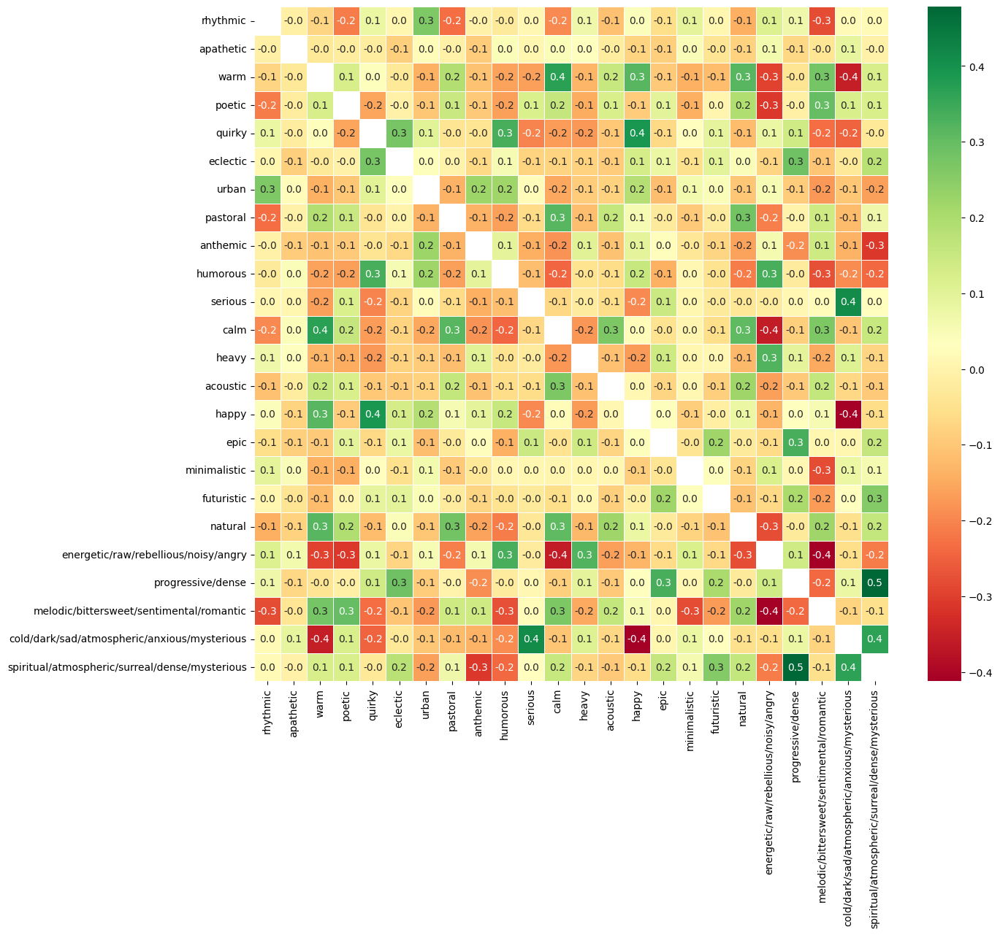

In [557]:
mergeColumns(df2, ['cold/dark/sad/atmospheric/anxious', 'spiritual/atmospheric/surreal/dense'], 'mysterious')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

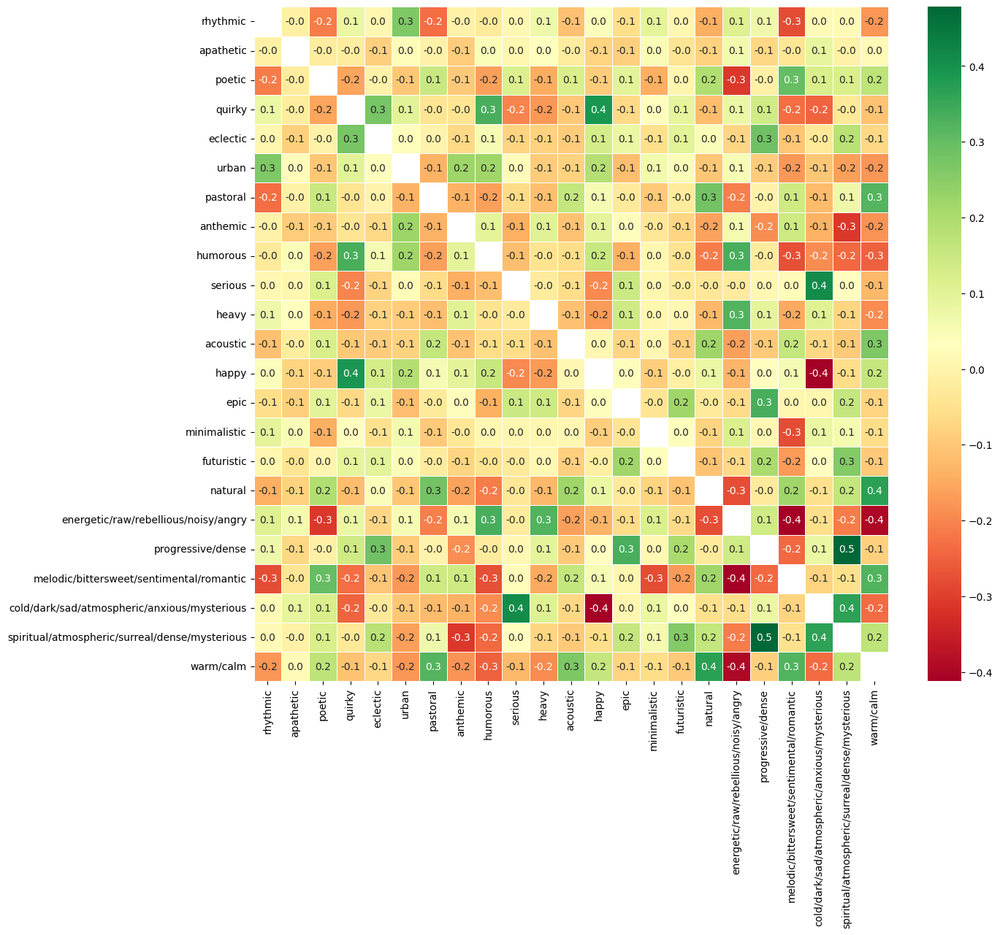

In [558]:
mergeColumns(df2, 'warm', 'calm')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

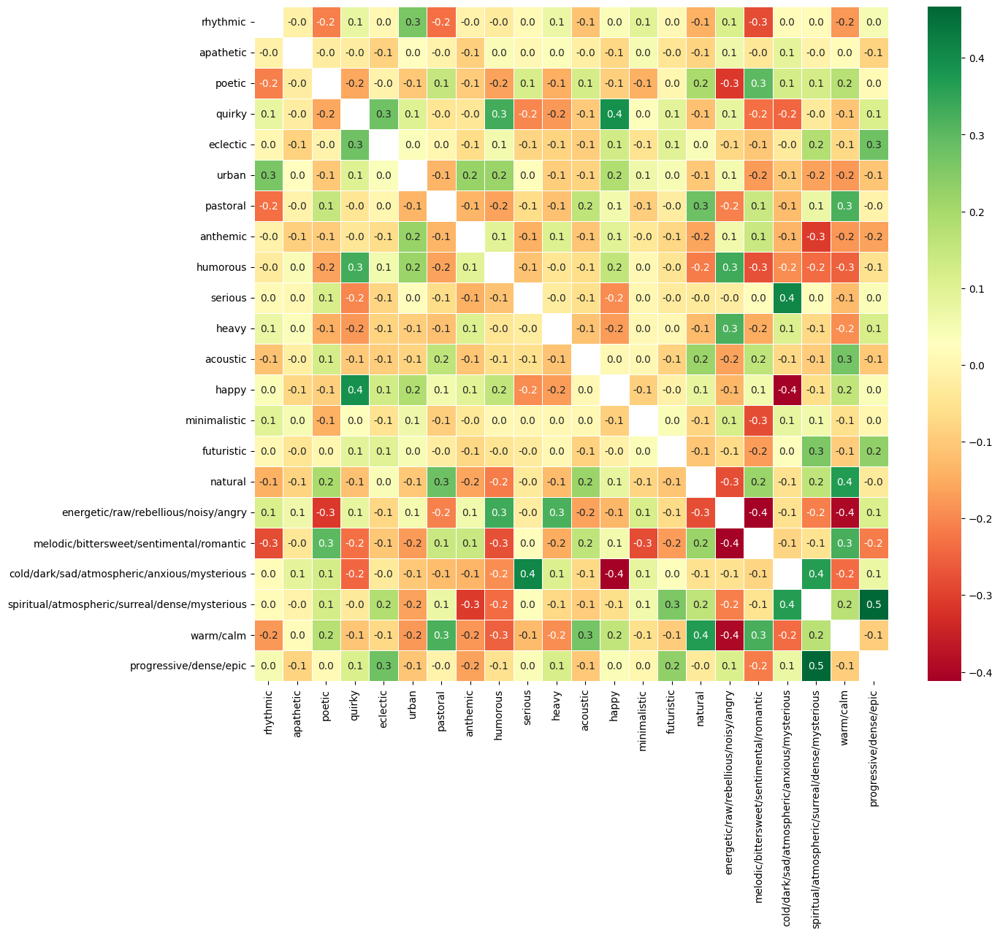

In [559]:
mergeColumns(df2, 'progressive/dense', 'epic')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

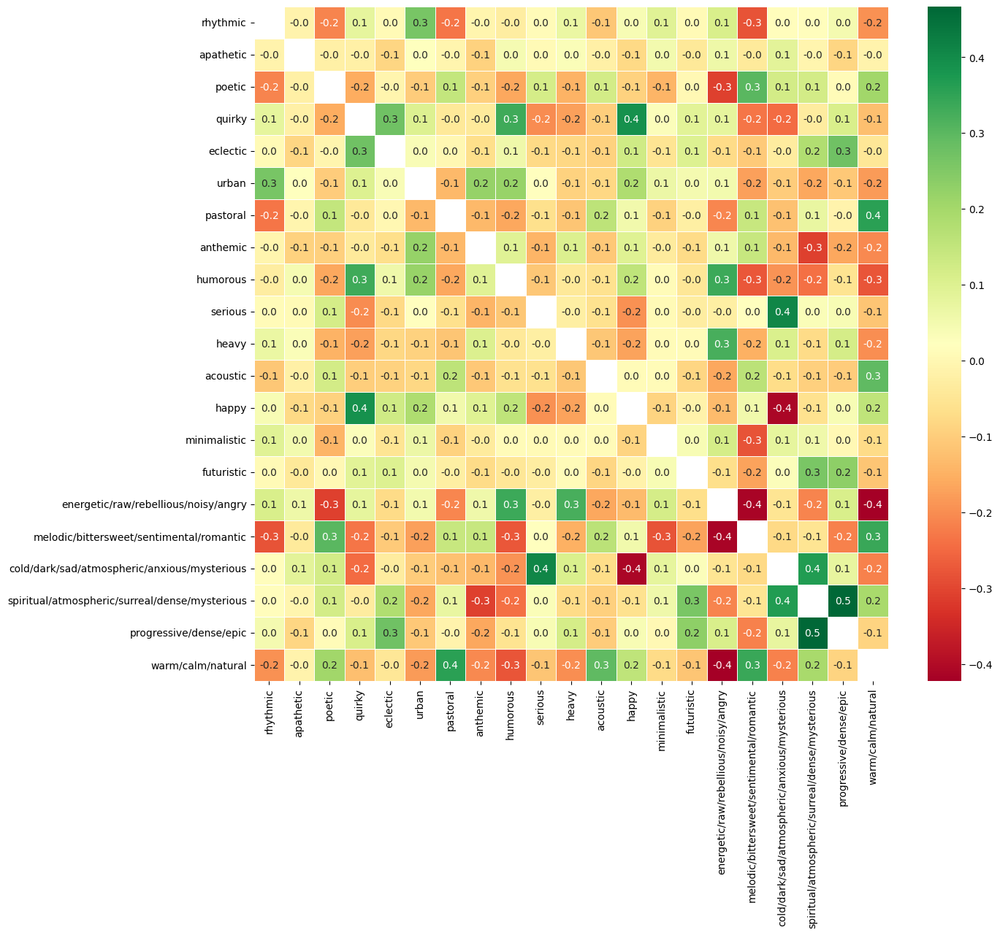

In [560]:
mergeColumns(df2, 'warm/calm', 'natural')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

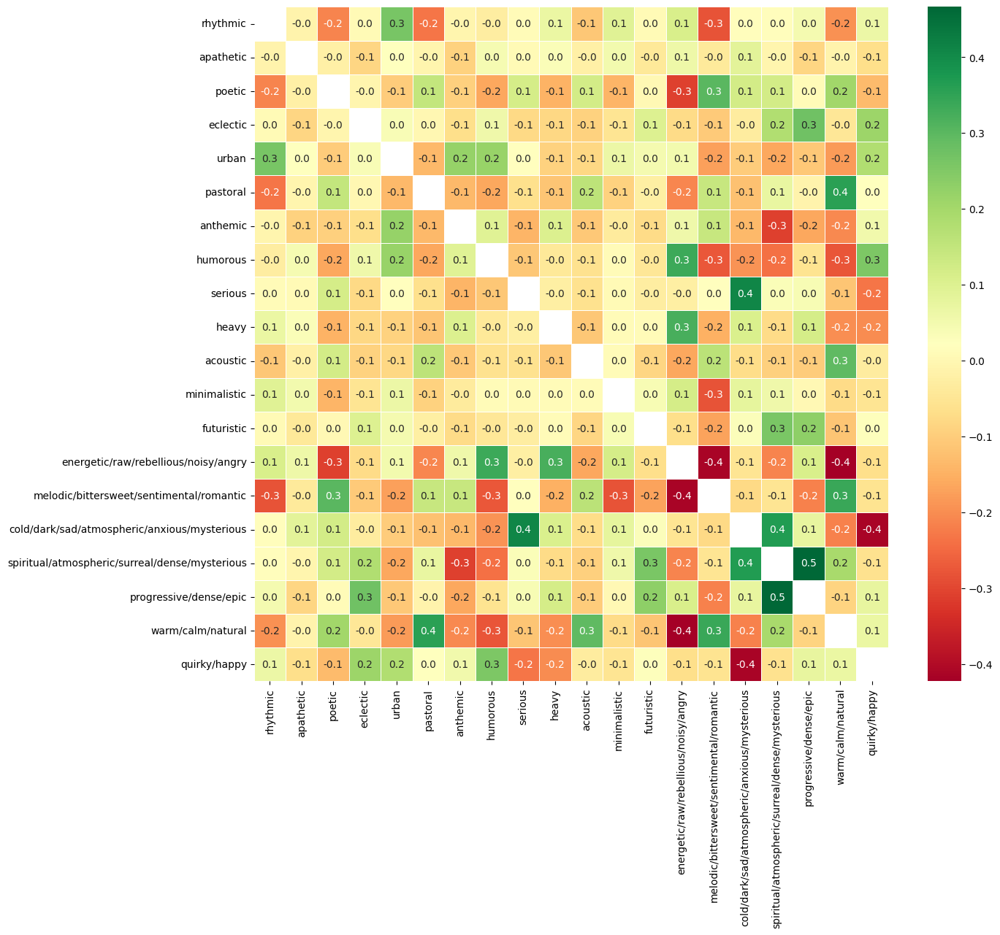

In [561]:
mergeColumns(df2, 'quirky', 'happy')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

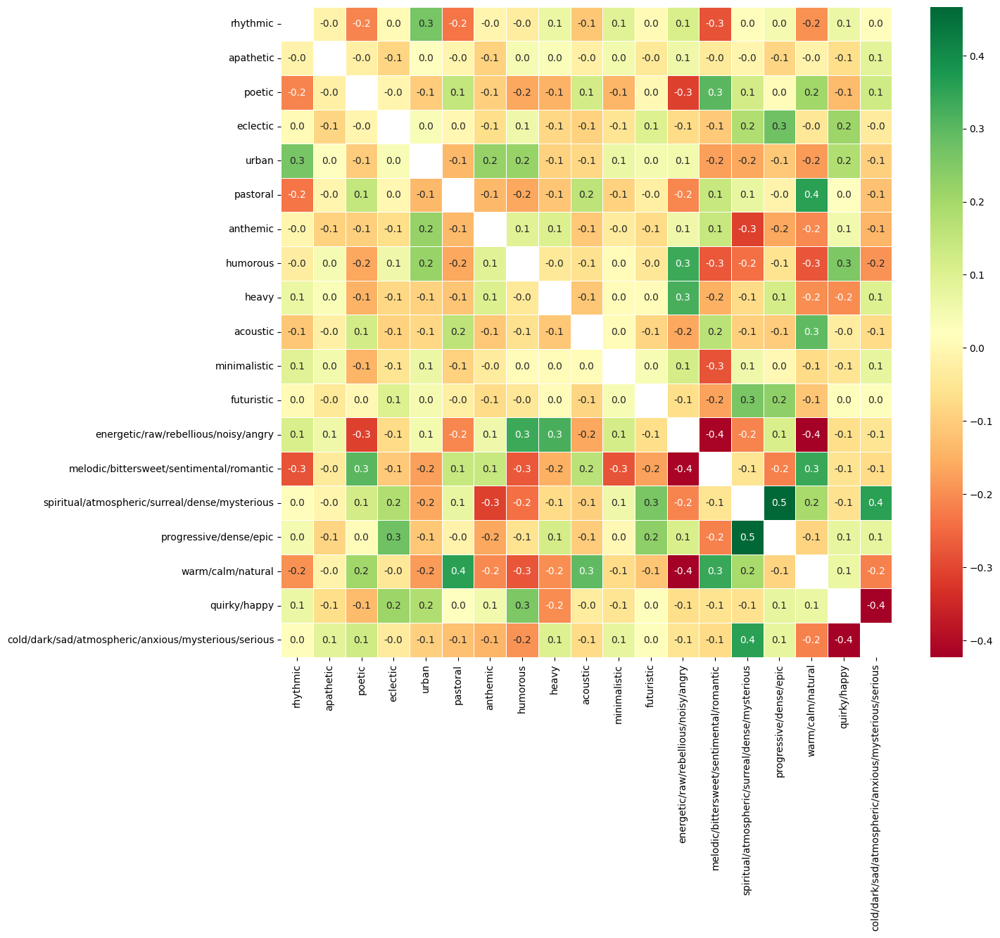

In [562]:
mergeColumns(df2, 'cold/dark/sad/atmospheric/anxious/mysterious', 'serious')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

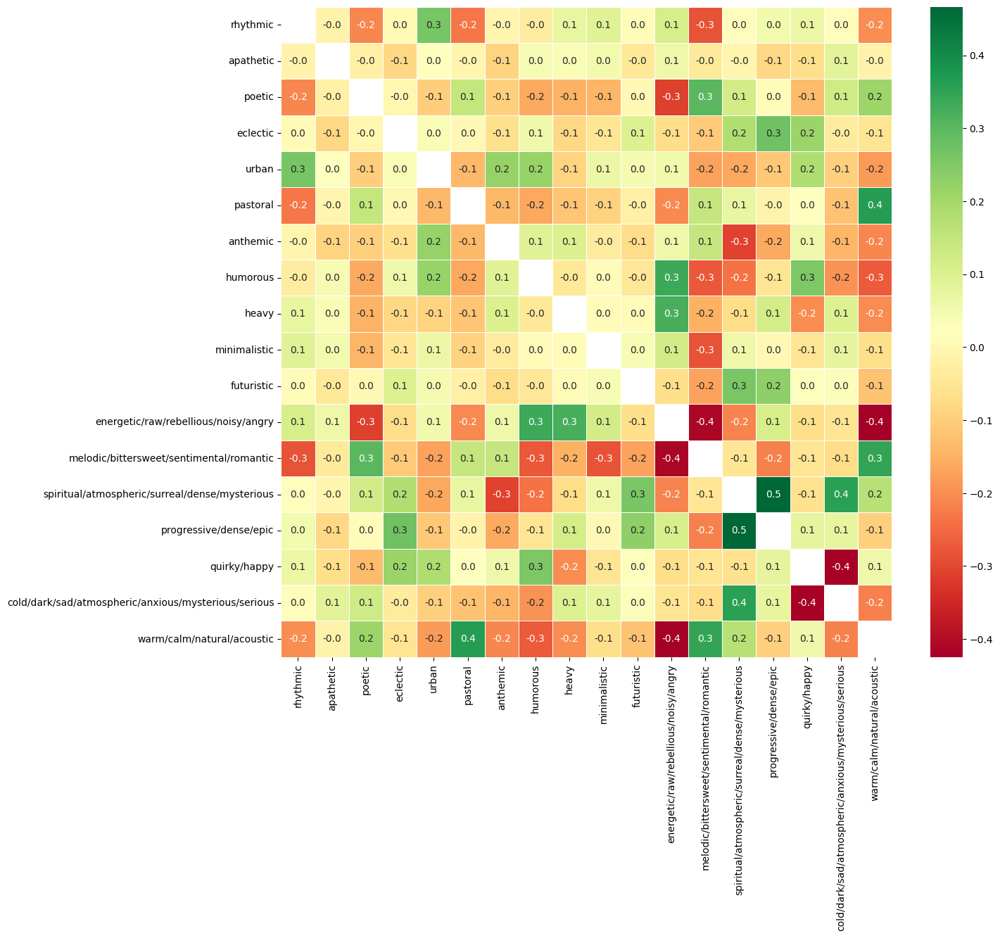

In [563]:
mergeColumns(df2, 'warm/calm/natural', 'acoustic')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

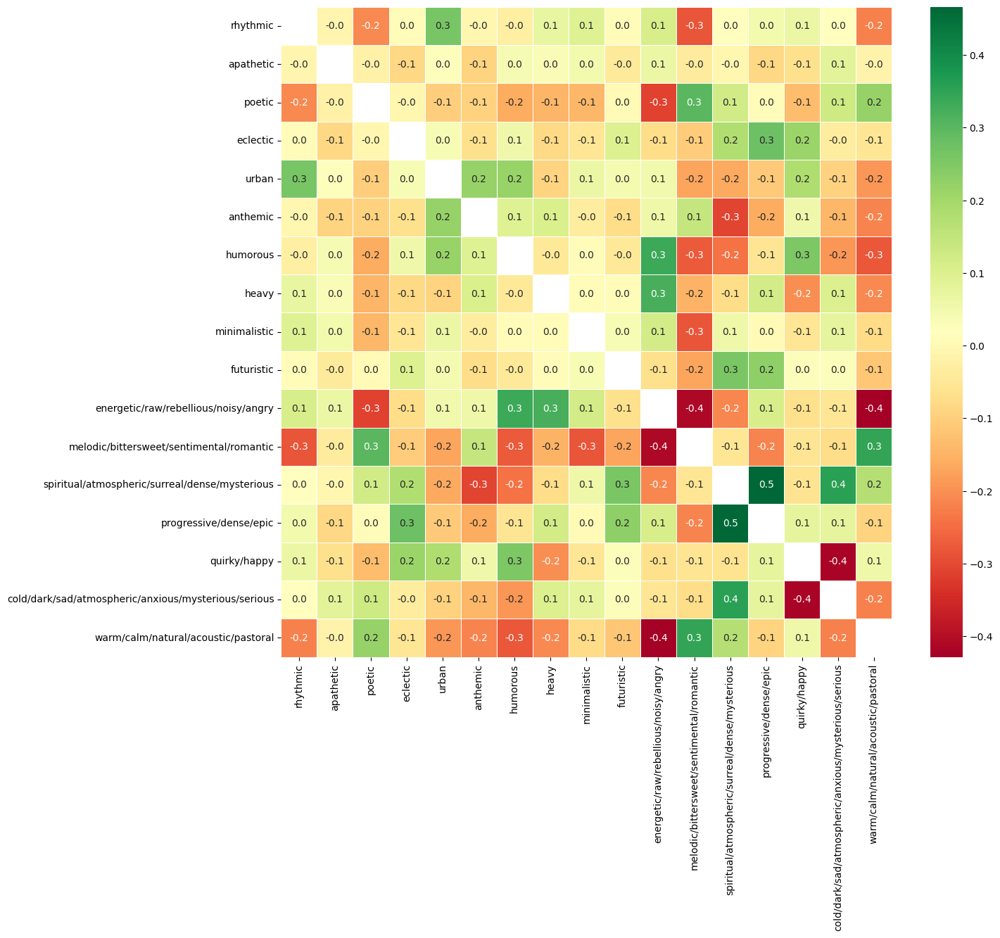

In [564]:
mergeColumns(df2, 'warm/calm/natural/acoustic', 'pastoral')
corr_matrix = df2.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

Let's check for variance again

In [565]:
variances_df2 = df2.var()
variances_sorted = variances_df2.sort_values(ascending=False)
variances_sorted

cold/dark/sad/atmospheric/anxious/mysterious/serious    11.111995
energetic/raw/rebellious/noisy/angry                     8.746301
warm/calm/natural/acoustic/pastoral                      4.174455
spiritual/atmospheric/surreal/dense/mysterious           4.097608
melodic/bittersweet/sentimental/romantic                 2.809696
progressive/dense/epic                                   1.963789
quirky/happy                                             1.296631
humorous                                                 0.930341
minimalistic                                             0.289194
urban                                                    0.280365
rhythmic                                                 0.248260
poetic                                                   0.229876
eclectic                                                 0.219138
apathetic                                                0.166839
anthemic                                                 0.143861
futuristic

Histograms can bring us a nice visual sense of variance.

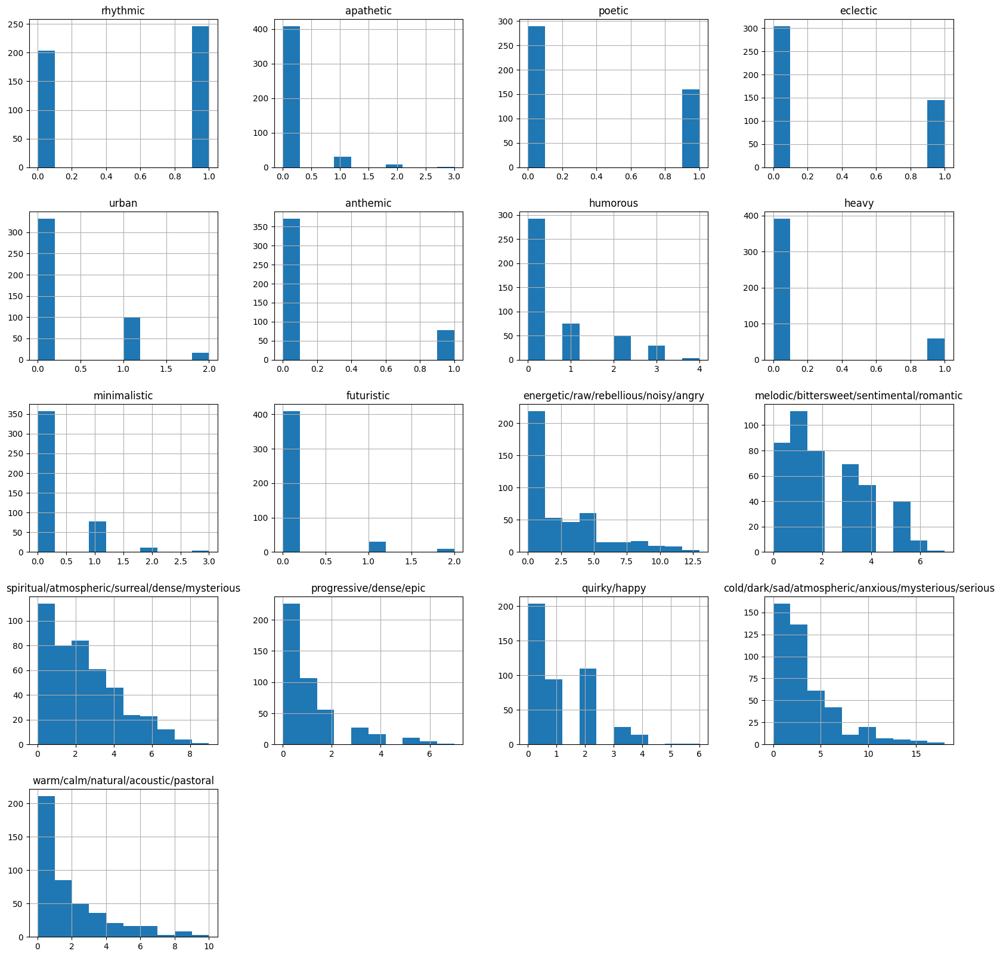

In [566]:
p = df2.hist(figsize = (20,20))

## Grouping opposite-like descriptors under an "axis" representation

At this point we'll just stop grouping similar descriptors. Instead, we'll be facing descriptors which are very negatively correlated against each other, in opposite sides of the same "axis". In practice, what this means is that both columns are merged just like before, but one group of descriptors contributes to the column as a negative value, which mathematically represents the idea of "opposites" between, for example, "energetic/raw/rebellious/noisy/angry" and "warm/calm/natural".

## Before forming the axes, we have 2 necessary steps:

### 1 - Scaling features

If we decide to form an axis with 2 fetures that don't have the same scale, here's an example of what could happen:
1) Feature 1 ranges from 0 to 10, and feature 2 from 0 to 4;
2) Album X has a F1 value of 3, but also a F2 value of 3;
3) After the creation of the axis, this album's axis value would land right in its origin, as if its value was perfectly neutral or balanced between the two features, even though its value of F2 is proportionally higher than its value of F1.

Therefore, by not normalizing first, we risk having data values at the origin of this newly created axis that semantically shouldn't be there.

We'll be using MinMaxScaler instead of StandardScaler, since the latter would transform some values into negative ones, which is prohibitive in this stage of modelling and in the way we are shaping our features. Before grouping opposite-like descriptors, it is crucial that all features/descriptors have only positive values, or else the notion of inverting the signal to mathematically represent "opposition" won't work properly.

In [567]:
# MinMaxScaler(), by default, scales data to range from 0 to 1.

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df3 = pd.DataFrame(scaler.fit_transform(df2), columns=df2.columns)

### 2 - Moving points away from the origin before forming the axes

It's hard to anticipate some effects on data before getting it wrong once (which is how I learned...), but picture what will happen when we form for example the "energetic/raw/rebellious/noisy/angry - warm/calm/natural" axis: let's imagine some data point A presents "warm/calm/natural" value equal to 1, and some data point B presents "energetic/raw/rebellious/noisy/angry" equal to 2. In this newly formed axis, the A data point will be represented closer to B than to another data point with "warm/calm/natural" value equal to 5. This doesn't correspond very well to how albums are related in the framed problem, so we need to artificially add some distance from the origin in all grouped descriptors before merging them in axes.

The value chosen as distance from the origin will be 0.5. The reason being: conceptually, the mildest value an album can present of a certain feature should be, at least, as distant from the origin (an album that didn't present a value for this feature at all) as it is from the most extreme value of the same feature. For example: if we have 3 albums distributed along the "sad" feature, the "mildly sad" valued album shouldn't be closer to the album that doesn't present the "sad" descriptor at all than to the album with an "extremely sad" value.

Since now all features range from 0.0 to 1.0, we can be sure that adding 0.5 to each non-zero value will prevent the effect described above.

In [568]:
variances_df3 = df3.var()
variances_sorted = variances_df3.sort_values(ascending=False)
variances_sorted
# variances_df3.iloc[0]

rhythmic                                                0.248260
poetic                                                  0.229876
eclectic                                                0.219138
anthemic                                                0.143861
heavy                                                   0.112741
urban                                                   0.070091
humorous                                                0.058146
melodic/bittersweet/sentimental/romantic                0.057341
energetic/raw/rebellious/noisy/angry                    0.051753
spiritual/atmospheric/surreal/dense/mysterious          0.050588
warm/calm/natural/acoustic/pastoral                     0.041745
progressive/dense/epic                                  0.040077
quirky/happy                                            0.036018
futuristic                                              0.035955
cold/dark/sad/atmospheric/anxious/mysterious/serious    0.034296
minimalistic             

In [569]:
# Only non-zero values will be added by 0.5 (thus, moved further from the origin)

def distanceDataFromOrigin(df):
    variances_df = df.var()
    
    for i, column in enumerate(df.columns):
        df[column] = df[column].apply(lambda x: x + 0.5 if x > 0 else x)

In [570]:
df3

,rhythmic,apathetic,poetic,eclectic,urban,anthemic,humorous,heavy,minimalistic,futuristic,energetic/raw/rebellious/noisy/angry,melodic/bittersweet/sentimental/romantic,spiritual/atmospheric/surreal/dense/mysterious,progressive/dense/epic,quirky/happy,cold/dark/sad/atmospheric/anxious/mysterious/serious,warm/calm/natural/acoustic/pastoral
0,1.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.307692,0.142857,0.000000,0.000000,0.000000,0.222222,0.0
1,0.0,0.0,1.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.000000,0.571429,0.555556,0.142857,0.000000,0.166667,0.6
2,0.0,0.0,0.0,0.0,0.0,0.0,1.00,0.0,0.000000,0.0,0.230769,0.428571,0.000000,0.000000,0.333333,0.277778,0.1
3,0.0,0.0,1.0,0.0,0.0,1.0,0.00,0.0,0.000000,0.0,0.000000,0.857143,0.111111,0.142857,0.333333,0.166667,0.1
4,0.0,0.0,1.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.000000,0.285714,0.222222,0.285714,0.000000,0.333333,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444,0.0,0.0,1.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.307692,0.714286,0.333333,0.000000,0.000000,0.166667,0.3
445,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.333333,0.0,0.153846,0.428571,0.000000,0.000000,0.166667,0.055556,0.5
446,1.0,0.0,0.0,1.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.230769,0.285714,0.444444,0.428571,0.000000,0.500000,0.1
447,0.0,0.0,1.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.000000,0.571429,0.222222,0.428571,0.000000,0.222222,0.1


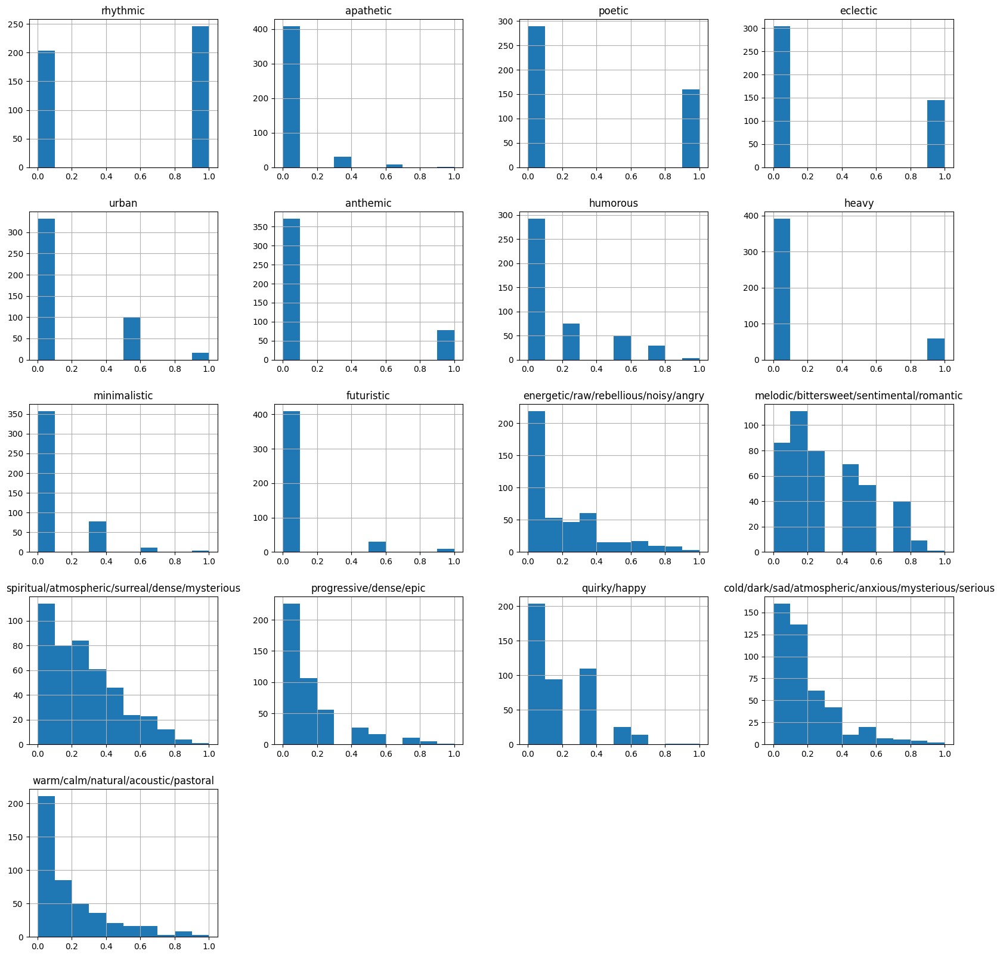

In [571]:
p = df3.hist(figsize = (20,20))

In [572]:
distanceDataFromOrigin(df3)
df3

,rhythmic,apathetic,poetic,eclectic,urban,anthemic,humorous,heavy,minimalistic,futuristic,energetic/raw/rebellious/noisy/angry,melodic/bittersweet/sentimental/romantic,spiritual/atmospheric/surreal/dense/mysterious,progressive/dense/epic,quirky/happy,cold/dark/sad/atmospheric/anxious/mysterious/serious,warm/calm/natural/acoustic/pastoral
0,1.5,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.807692,0.642857,0.000000,0.000000,0.000000,0.722222,0.0
1,0.0,0.0,1.5,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.000000,1.071429,1.055556,0.642857,0.000000,0.666667,1.1
2,0.0,0.0,0.0,0.0,0.0,0.0,1.50,0.0,0.000000,0.0,0.730769,0.928571,0.000000,0.000000,0.833333,0.777778,0.6
3,0.0,0.0,1.5,0.0,0.0,1.5,0.00,0.0,0.000000,0.0,0.000000,1.357143,0.611111,0.642857,0.833333,0.666667,0.6
4,0.0,0.0,1.5,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.000000,0.785714,0.722222,0.785714,0.000000,0.833333,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444,0.0,0.0,1.5,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.807692,1.214286,0.833333,0.000000,0.000000,0.666667,0.8
445,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.833333,0.0,0.653846,0.928571,0.000000,0.000000,0.666667,0.555556,1.0
446,1.5,0.0,0.0,1.5,0.0,0.0,0.00,0.0,0.000000,0.0,0.730769,0.785714,0.944444,0.928571,0.000000,1.000000,0.6
447,0.0,0.0,1.5,0.0,0.0,0.0,0.00,0.0,0.000000,0.0,0.000000,1.071429,0.722222,0.928571,0.000000,0.722222,0.6


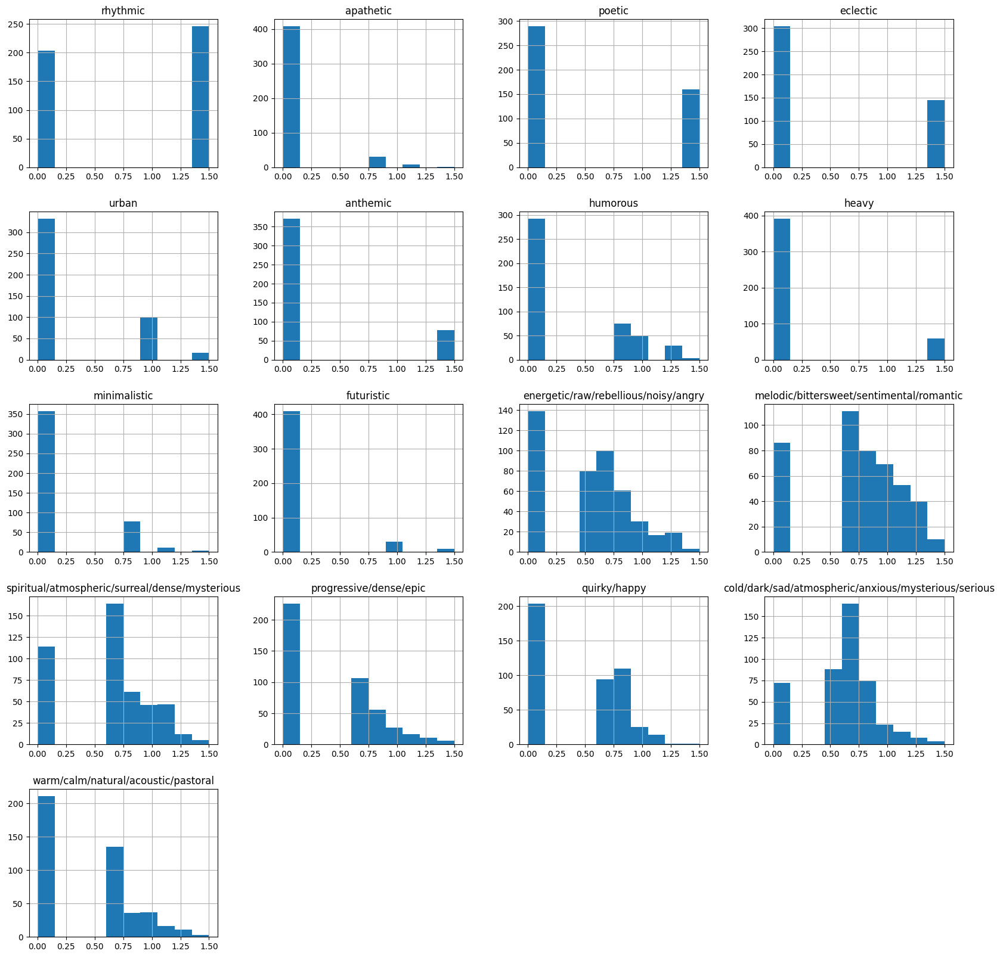

In [573]:
p = df3.hist(figsize = (20,20))

Features now range from 0.0 to 1.5, instead of 0.0 to 1.0 but that won't affect our model's performance.

One thing that may have caught your attention is how the histogram in some features changed after using "distanceDataFromOrigin()", especially the ones with a more continuous set of values. "Aren't we just moving values away from the origin? Why is the distribution getting warped too?" would be a good question. This is merely a limitation of the plotted histogram, which has only 10 plotted bars, so when values move in one direction, they may "jump" out of the interval of some plotted bar and enter the next bar interval. This is nothing to worry about since histogram bars are merely a visualization tool, and we don't train our model with them, but with the underlying values.

Now we can move on to merging opposite groups of descriptors into axes

In [574]:
def mergeColumnsIntoAxis(df, col1, col2):
    
    mergedColumnName = col1 + '-' + col2
    
    df[mergedColumnName] = -df[col1] + df[col2]
    df.drop(col1, axis=1, inplace=True)
    df.drop(col2, axis=1, inplace=True)

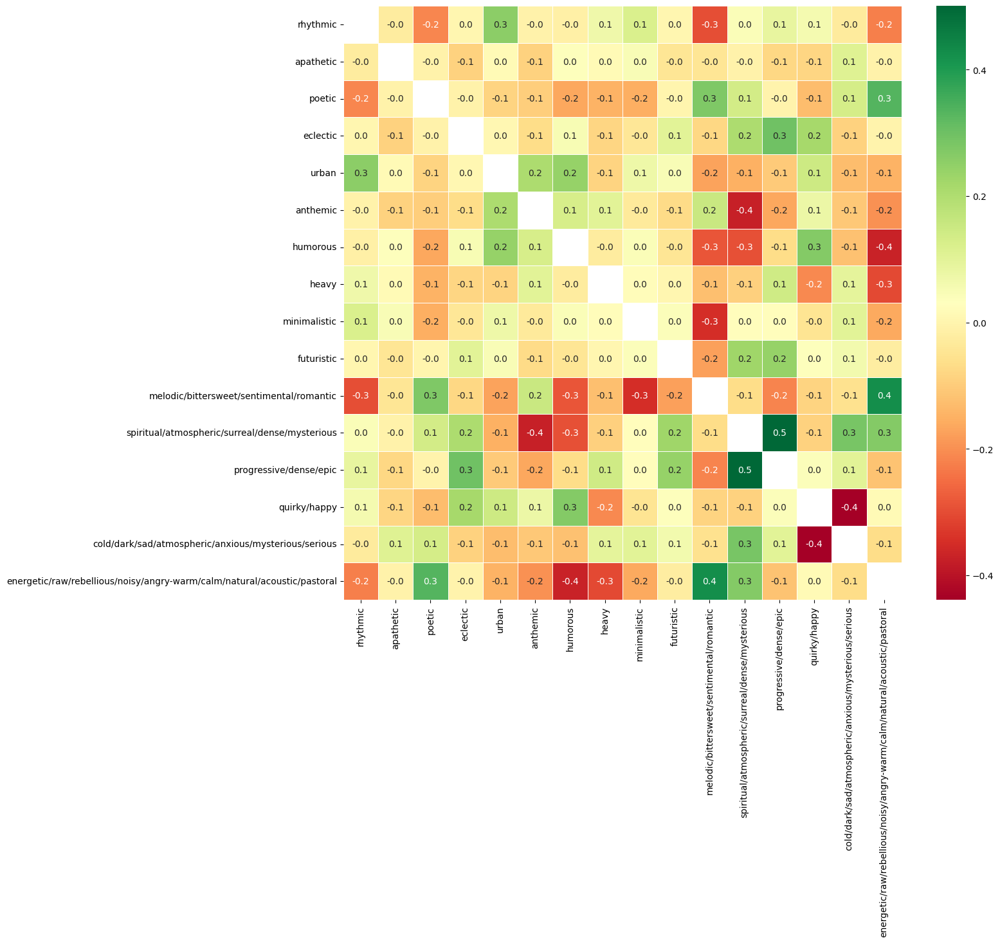

In [575]:
mergeColumnsIntoAxis(df3, 'energetic/raw/rebellious/noisy/angry', 'warm/calm/natural/acoustic/pastoral')
corr_matrix = df3.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

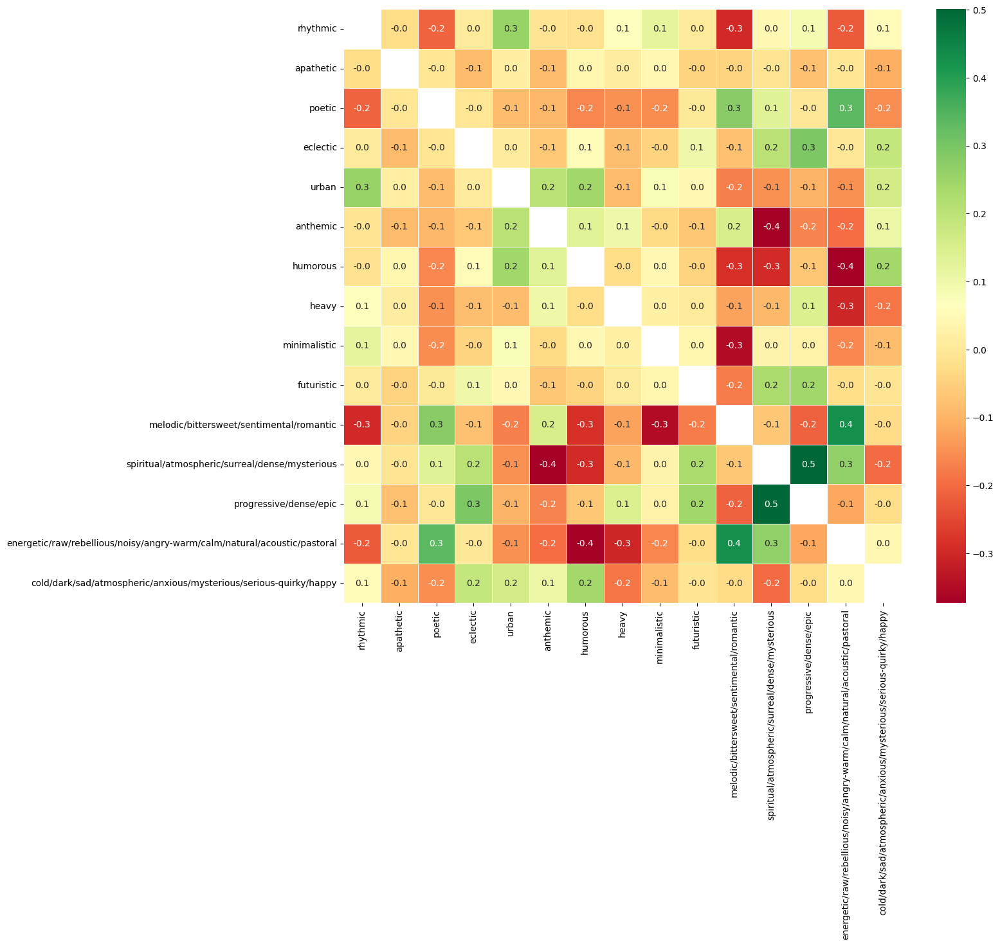

In [576]:
mergeColumnsIntoAxis(df3, 'cold/dark/sad/atmospheric/anxious/mysterious/serious', 'quirky/happy')
corr_matrix = df3.corr()
np.fill_diagonal(corr_matrix.values, np.nan)

plt.figure(figsize=(14,12))
p=sns.heatmap(corr_matrix, annot=True, cmap ='RdYlGn', fmt=".1f",linewidths=0.5)

In [577]:
df3.columns

Index(['rhythmic', 'apathetic', 'poetic', 'eclectic', 'urban', 'anthemic',
       'humorous', 'heavy', 'minimalistic', 'futuristic',
       'melodic/bittersweet/sentimental/romantic',
       'spiritual/atmospheric/surreal/dense/mysterious',
       'progressive/dense/epic',
       'energetic/raw/rebellious/noisy/angry-warm/calm/natural/acoustic/pastoral',
       'cold/dark/sad/atmospheric/anxious/mysterious/serious-quirky/happy'],
      dtype='object')

In [578]:
variances_df3 = df3.var()
variances_sorted = variances_df3.sort_values(ascending=False)
variances_sorted

rhythmic                                                                    0.558585
poetic                                                                      0.517221
energetic/raw/rebellious/noisy/angry-warm/calm/natural/acoustic/pastoral    0.516981
eclectic                                                                    0.493060
cold/dark/sad/atmospheric/anxious/mysterious/serious-quirky/happy           0.387733
anthemic                                                                    0.323688
heavy                                                                       0.253666
urban                                                                       0.228126
humorous                                                                    0.214560
progressive/dense/epic                                                      0.176385
spiritual/atmospheric/surreal/dense/mysterious                              0.160897
melodic/bittersweet/sentimental/romantic                         

Notice that, after Min-Max scaling, single-descriptor features (rhytmic, poetic, eclectic...) increased their variance relative to the others, since grouped features' high variance was a product of their higher scales, thanks to the adding strategy we used for grouping sub-descriptors. This strategy served its purpose of distinguishing between strong associations (with a super-feature) and weak associations, but also warped scales. Min-Max Scaling puts all features on the same scale and allows us to really look at which will contribute the most in the task of separating data points.

From these, we'll select the 12/15 with more variance, leaving behind "minimalistic", "futuristic" and "apathetic". Again, for the purpose of keeping dimensions low.

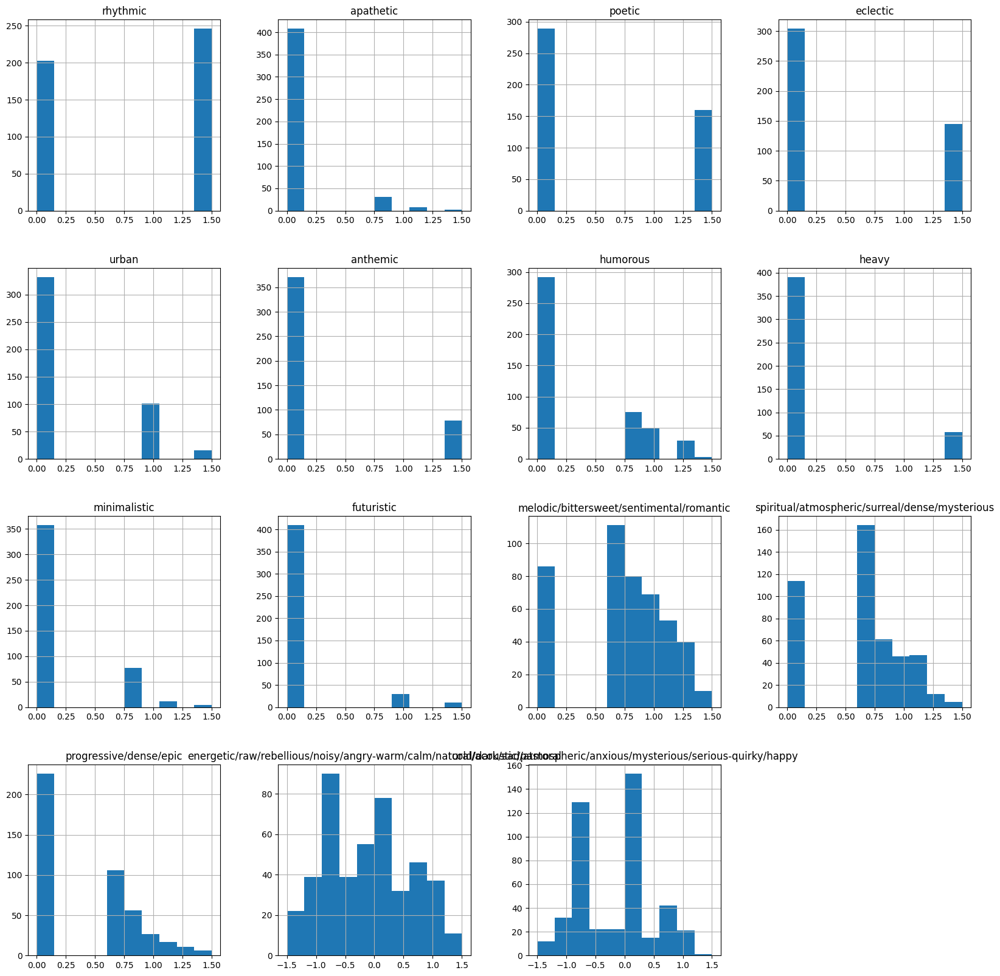

In [579]:
p = df3.hist(figsize = (20,20))

In [591]:
df3.columns

Index(['rhythmic', 'apathetic', 'poetic', 'eclectic', 'urban', 'anthemic',
       'humorous', 'heavy', 'minimalistic', 'futuristic',
       'melodic/bittersweet/sentimental/romantic',
       'spiritual/atmospheric/surreal/dense/mysterious',
       'progressive/dense/epic',
       'energetic/raw/rebellious/noisy/angry-warm/calm/natural/acoustic/pastoral',
       'cold/dark/sad/atmospheric/anxious/mysterious/serious-quirky/happy'],
      dtype='object')

In [592]:
df3.to_csv('modeled_descriptor_dataset.csv', index=False)

In [588]:
df4 = df3[['rhythmic', 'apathetic', 'poetic', 'eclectic', 'urban', 'anthemic',
       'humorous', 'heavy', 'minimalistic', 'futuristic',
       'melodic/bittersweet/sentimental/romantic',
       'spiritual/atmospheric/surreal/dense/mysterious',
       'progressive/dense/epic',
       'energetic/raw/rebellious/noisy/angry-warm/calm/natural/acoustic/pastoral',
       'cold/dark/sad/atmospheric/anxious/mysterious/serious-quirky/happy']]